In [1]:
import astropy
from astropy.table import Table
from astropy.io import fits
import matplotlib.pyplot as plt
import photutils
from util import show_imstat, plot_line, plot_zscale_image, overscan_subs_trim

import numpy as np

from astropy.visualization import ZScaleInterval
from astropy import stats as astrostats

import scipy
import scipy.stats as scistats

In [2]:
import ccdproc as ccdp
import astropy.units as u

In [3]:
zscale = ZScaleInterval()

# Individual flat field image
V filter 43 - 49

In [4]:
file_template = "../reduction/a{num:0>3}_zt.fits"

INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


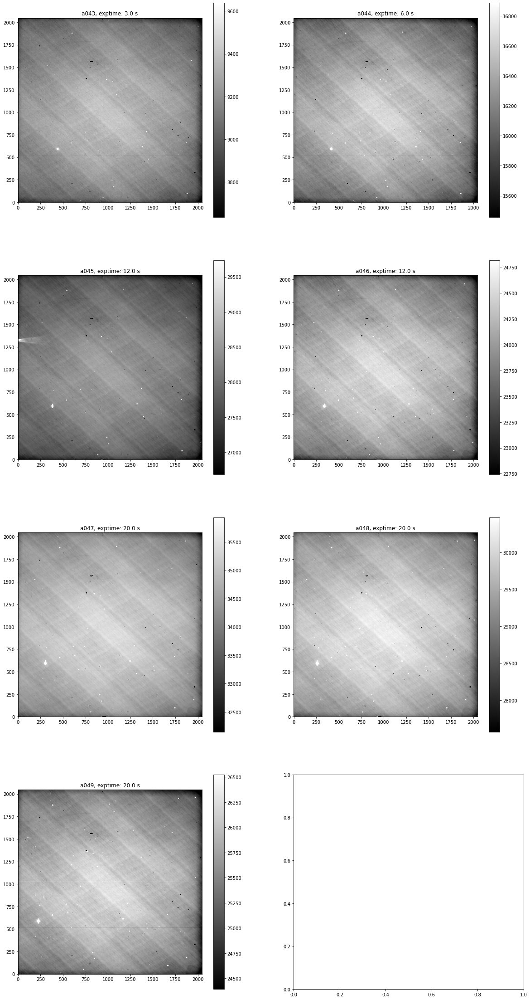

In [5]:
fig, ax = plt.subplots(4, 2, figsize=(20, 40))
axs = np.ravel(ax)
for i in range(43, 50):
    flat_v = ccdp.CCDData.read(file_template.format(num=i), unit='adu')
    vmin, vmax = zscale.get_limits(flat_v.data)
    plot_zscale_image(flat_v.data, axs[i-43], 'gray', vmin, vmax)
    axs[i-43].set_aspect('equal')
    axs[i-43].set_title(f"a{i:0>3}, exptime: {flat_v.header['EXPTIME']} s")

There are significant differences in different flat field, for example, a045 has a light leak? All other V filter has a bright star image. All V band also has the slash pattern, which might be due to the interference or diffraction.

a047, a048, a049 all have same exposure time, but the signal levels are different. 

INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


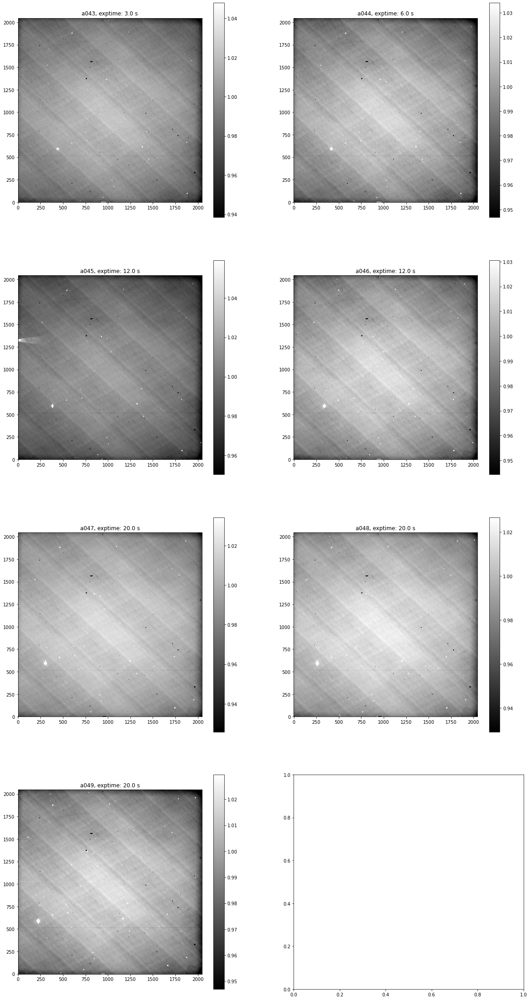

In [6]:
# First substract the masterbias
# and the scaled masterdark
combined_dark = ccdp.CCDData.read("../reduction/dark/masterdark.fits")
combined_bias = ccdp.CCDData.read("../reduction/bias/masterbias.fits")
fig, ax = plt.subplots(4, 2, figsize=(20, 40))
axs = np.ravel(ax)
for i in range(43, 50):
    flat_v = ccdp.CCDData.read(file_template.format(num=i), unit='adu')
    flat_v_b = ccdp.subtract_bias(flat_v, combined_bias)
    flat_v_d = ccdp.subtract_dark(flat_v_b, combined_dark, 
                                  dark_exposure=combined_dark.header['EXPTIME'] * u.s,
                                 data_exposure=flat_v_b.header['EXPTIME'] * u.s,
                                 scale=True)
    flat_v_d.write(f"../reduction/flat/V_band/a{i:0>3}_d.fits", overwrite=True)
    # use inverse median to scale all the image to unity first
    flat_v_d.data /= np.median(flat_v_d.data)
    flat_v_d.write(f"../reduction/flat/V_band/a{i:0>3}_d_medscaled.fits", overwrite=True)
    vmin, vmax = zscale.get_limits(flat_v_d.data)
    plot_zscale_image(flat_v_d.data, axs[i-43], 'gray', vmin, vmax)
    axs[i-43].set_aspect('equal')
    axs[i-43].set_title(f"a{i:0>3}, exptime: {flat_v.header['EXPTIME']} s")

In [14]:
def inv_median(a):
    return 1 / np.median(a)

In [15]:
# chose to scale to a common median, but common mean and common median has no difference
flat_v_files = [f"../reduction/flat/V_band/a{i:0>3}_d.fits" for i in range(43, 50)]
# has to scale to a common mean when combining
combined_flatV_avg = ccdp.combine(flat_v_files, method='average', scale=inv_median)
combined_flatV_med = ccdp.combine(flat_v_files, method='median', scale=inv_median)
combined_flatV_clip_avg = ccdp.combine(flat_v_files,
                             method='average',
                               scale=inv_median,
                             sigma_clip=True, sigma_clip_low_thresh=3, sigma_clip_high_thresh=3,
                             sigma_clip_func=np.ma.mean, sigma_clip_dev_func=np.ma.std,
                            )


In [8]:
# use original image brightness
mean_count = []
for i in range(43, 50):
    flat_v_d = ccdp.CCDData.read(f"../reduction/flat/V_band/a{i:0>3}_d.fits")
    mean_count.append(np.mean(flat_v_d.data))
mean_count = np.array(mean_count)
mean_count /= np.sum(mean_count)

In [9]:
mean_count

array([0.05480565, 0.09724987, 0.16726288, 0.14346751, 0.20691977,
       0.17681592, 0.15347839])

In [16]:
combined_flatV_clip_weighted_avg = ccdp.combine(flat_v_files,
                                                 method='average',
                                                 weights=mean_count,
                                                scale=inv_median,
                                                 sigma_clip=True, sigma_clip_low_thresh=3, sigma_clip_high_thresh=3,
                                                 sigma_clip_func=np.ma.mean, sigma_clip_dev_func=np.ma.std,
                                                )
combined_flatV_clip_med_weighted_avg = ccdp.combine(flat_v_files,
                                                 method='median',
                                                 weights=mean_count,
                                                    scale=inv_median,
                                                 sigma_clip=True, sigma_clip_low_thresh=3, sigma_clip_high_thresh=3,
                                                 sigma_clip_func=np.ma.mean, sigma_clip_dev_func=np.ma.std,
                                                )

In [13]:
combined_flatV_avg.write("../reduction/flat/V_band/masterflatV_avg.fits")
combined_flatV_med.write("../reduction/flat/V_band/masterflatV_med.fits")
combined_flatV_clip_avg.write("../reduction/flat/V_band/masterflatV_clip_avg.fits")
combined_flatV_clip_weighted_avg.write("../reduction/flat/V_band/masterflatV_clip_avg_weighted_count.fits")
combined_flatV_clip_med_weighted_avg.write("../reduction/flat/V_band/masterflatV_clip_med_weighted_count.fits")

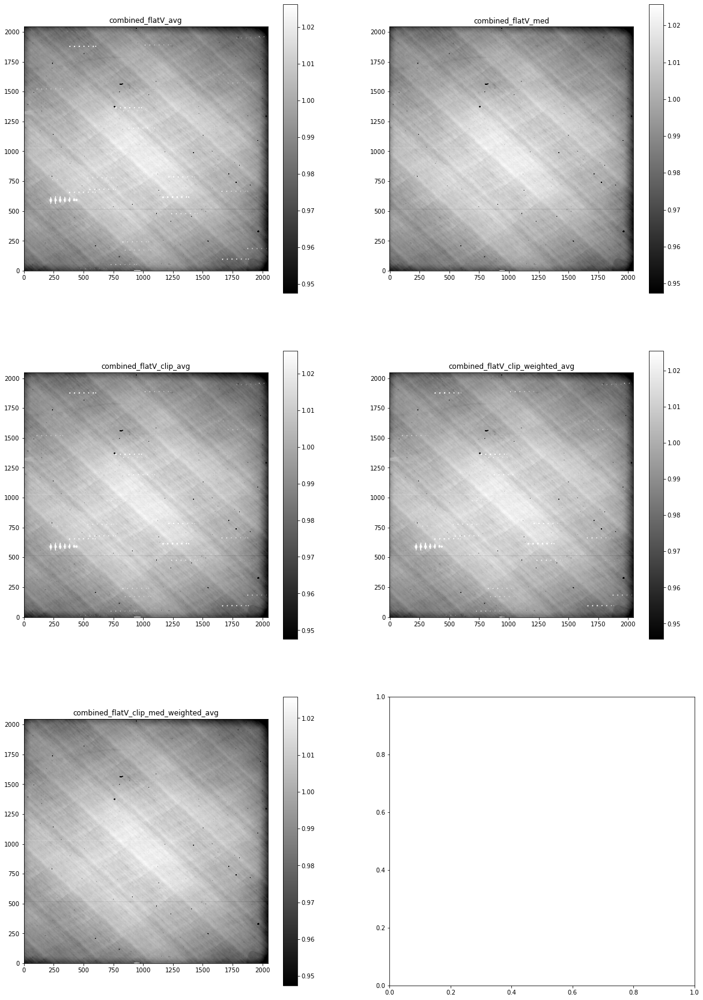

In [17]:
masterVs = [combined_flatV_avg, combined_flatV_med, combined_flatV_clip_avg, combined_flatV_clip_weighted_avg, 
            combined_flatV_clip_med_weighted_avg]
masterVs_name = ["combined_flatV_avg", "combined_flatV_med", "combined_flatV_clip_avg", "combined_flatV_clip_weighted_avg", 
            "combined_flatV_clip_med_weighted_avg"]
fig, ax = plt.subplots(3, 2, figsize=(20, 30))
axs = ax.ravel()
for i, master in enumerate(masterVs):
    vmin, vmax = zscale.get_limits(master.data)
    plot_zscale_image(master.data, axs[i], 'gray', vmin, vmax)
    axs[i].set_aspect('equal')
    axs[i].set_title(f"{masterVs_name[i]}")

Mean: 0.9989039216072774 Std: 0.015270683074193311 Median: 1.0001124940083226 RMS: 0.9990206396085883 Min: 0.0009988462818374612 Max: 2.338290860336257
Mean: 0.9987532321499448 Std: 0.014307065471136575 Median: 1.0000635870293577 RMS: 0.9988557007157525 Min: 0.0010043462010879012 Max: 1.8770015191170255
Mean: 0.9989039216072774 Std: 0.015270683074193311 Median: 1.0001124940083226 RMS: 0.9990206396085883 Min: 0.0009988462818374612 Max: 2.338290860336257
Mean: 0.9988780779834217 Std: 0.014836264926664193 Median: 1.0001059361908098 RMS: 0.9989882529003176 Min: 0.0009967750762955657 Max: 1.997243399083705
Mean: 0.9987532321499448 Std: 0.014307065471136575 Median: 1.0000635870293577 RMS: 0.9988557007157525 Min: 0.0010043462010879012 Max: 1.8770015191170255


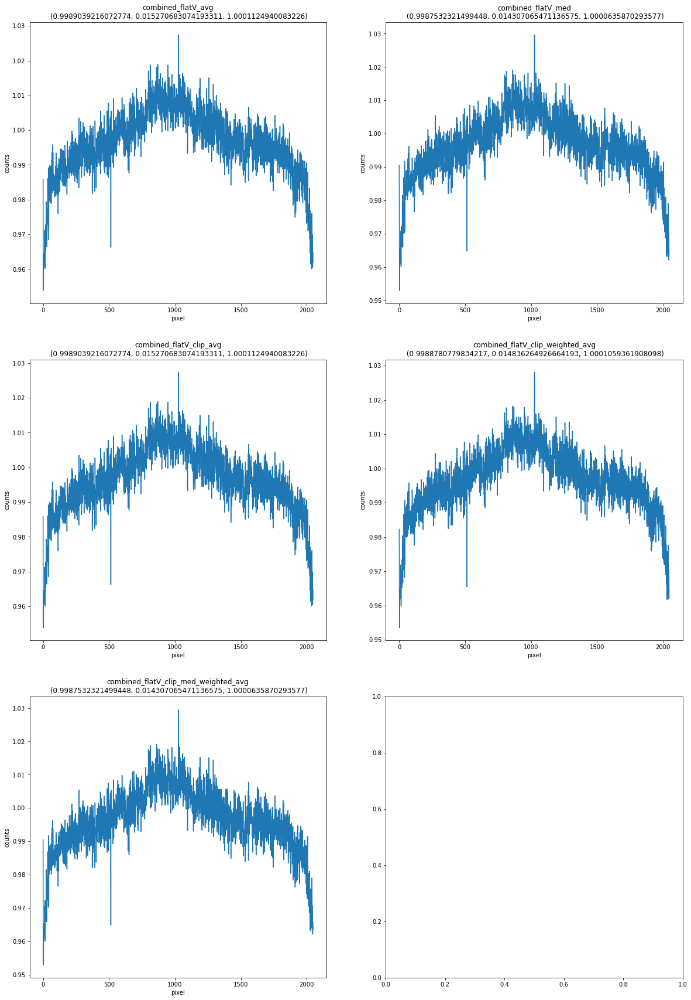

In [55]:
fig, ax = plt.subplots(3, 2, figsize=(20, 30))
axs = ax.ravel()
for i, master in enumerate(masterVs):
    axs[i].plot(master.data[:, 200].ravel())
    axs[i].set_ylabel("counts")
    axs[i].set_xlabel("pixel")
#     plot_line(master.data[:, 2000])
#     axs[i].set_aspect('equal')
    axs[i].set_title(f"{masterVs_name[i]}\n {show_imstat(master.data)}")

From the plots above, simple median and 3-sigma clipping median with weighted image can successfully remove all the stars in the flat. Hence,
a median must be better. Further because the weighted by mean counts can be better as contributions from flats with different exposure,
type, etc will be significantly different. Combining them with weight such as mean count or exposure time is better.

For all master flats, use weighted count and scale with median, combine with median and 3 sigma rejection

In [48]:
def inv_median(a):
    return 1 / np.median(a)

def make_masterflat(band, num_range, overwrite=True):
    root_dir = f"../reduction/flat/{band}_band"
    for i in num_range:
        flat = ccdp.CCDData.read(file_template.format(num=i), unit='adu')
        flat_b = ccdp.subtract_bias(flat, combined_bias)
        flat_d = ccdp.subtract_dark(flat_b, combined_dark, 
                                      dark_exposure=combined_dark.header['EXPTIME'] * u.s,
                                     data_exposure=flat_b.header['EXPTIME'] * u.s,
                                     scale=True)
        flat_d.write(f"{root_dir}/a{i:0>3}_d.fits", overwrite=overwrite)
        # use inverse median to scale all the image to unity first
    #         flat_d.data /= np.median(flat_v_d.data)
    #         flat_d.write(f"{root_dir}/a{i:0>3}_d_medscaled.fits", overwrite=True)
    flat_files = [f"{root_dir}/a{i:0>3}_d.fits" for i in num_range]
    # use original image brightness
    mean_count = np.array([np.mean(ccdp.CCDData.read(file).data) for file in flat_files])
    mean_count /= np.sum(mean_count)
    combined_flat_clip_med_weighted_avg = ccdp.combine(flat_files,
                                                 method='median',
                                                 weights=mean_count,
                                                    scale=inv_median,
                                                 sigma_clip=True, sigma_clip_low_thresh=3, sigma_clip_high_thresh=3,
                                                 sigma_clip_func=np.ma.mean, sigma_clip_dev_func=np.ma.std,
                                                )
    combined_flat_clip_med_weighted_avg.write(f"{root_dir}/masterflat{band}_clip_med_weighted_count.fits", overwrite=overwrite)
    combined_flat_clip_med_weighted_avg.data /= np.mean(combined_flat_clip_med_weighted_avg.data)
    combined_flat_clip_med_weighted_avg.write(f"{root_dir}/masterflat{band}_norm.fits", overwrite=overwrite)
    fig, ax = plt.subplots(1, 2, figsize=(30, 10))
    vmin, vmax = zscale.get_limits(combined_flat_clip_med_weighted_avg.data)
    plot_zscale_image(combined_flat_clip_med_weighted_avg.data, ax[0], 'gray', vmin, vmax)
    ax[0].set_aspect('equal')
#     ax.set_title(f"{masterVs_name[i]}")
    ax[1].plot(combined_flat_clip_med_weighted_avg.data[:, 200].ravel())
    ax[1].set_ylabel("counts")
    ax[1].set_xlabel("pixel")
    show_imstat(combined_flat_clip_med_weighted_avg.data)

INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


Mean: 1.0000000000000004 Std: 0.014324925327489324 Median: 1.0013119906271464 RMS: 1.0001025964798 Min: 0.0010055999507765465 Max: 1.8793446255753667


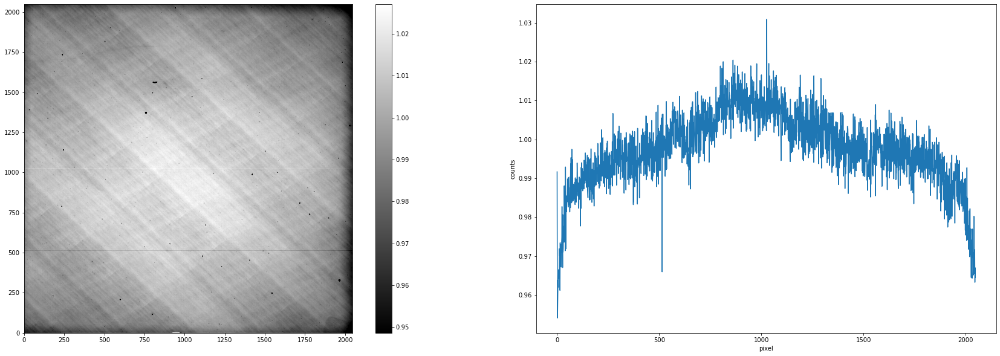

In [49]:
make_masterflat("V", np.arange(43, 50))

## B band
35			3	B	3:13	     
36			3	B	
37			3	B		
38			3	B	
39			4	B	previously not tracking; now tracking
40			5	B    
41			6	B
42			6	B

INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


Mean: 1.0000000000000016 Std: 0.017970080131165488 Median: 1.0020161955592184 RMS: 1.0001614488570933 Min: 0.000983010892691146 Max: 1.5758807885920587


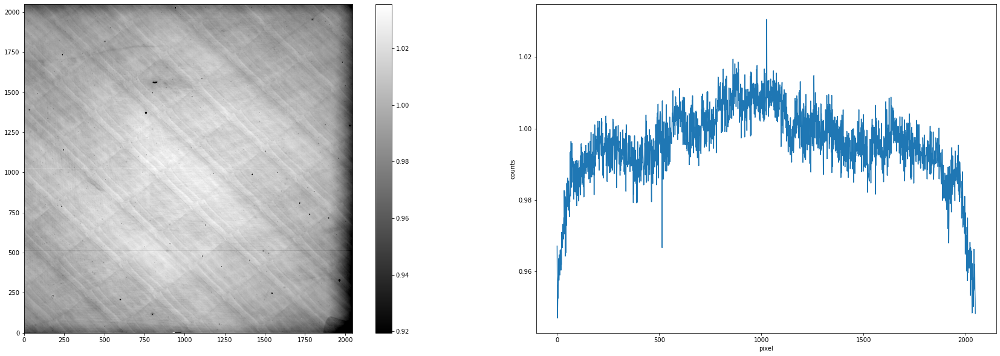

In [50]:
make_masterflat("B", np.arange(35, 43))

## R band
50 - 55

50			15	R  <br>
51			20	R  <br>
52			25	R  <br>
53			30	R <br>
54			40	R <br>
55			50	R <br>

INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


Mean: 0.9999999999999997 Std: 0.018619814369984382 Median: 1.0033918672160613 RMS: 1.0001733337212957 Min: 0.0008989160058657417 Max: 2.7968930712430393


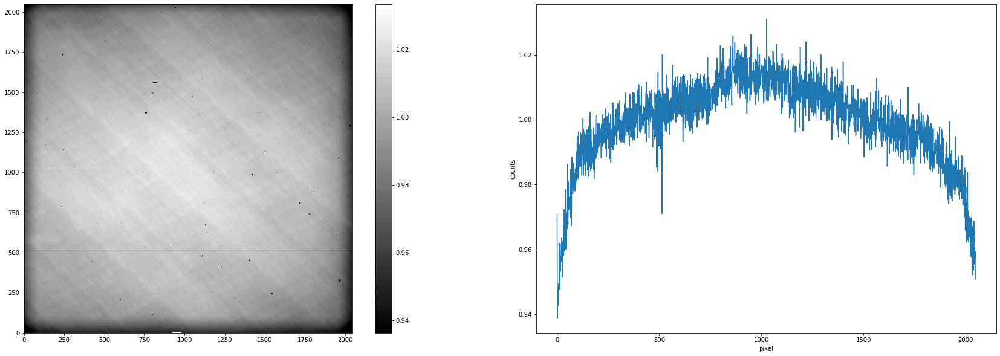

In [51]:
make_masterflat("R", np.arange(50, 56))

## I band
57 - 62

57			50	I  <br>
58			80	I <br>
59			120	I <br>
60			120	I <br>
61			200	I <br>
62			200	I <br>

INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


Mean: 1.000000000000001 Std: 0.022239917300907013 Median: 1.004616332900548 RMS: 1.0002472763879697 Min: 0.00750868986109887 Max: 2.4926251301343734


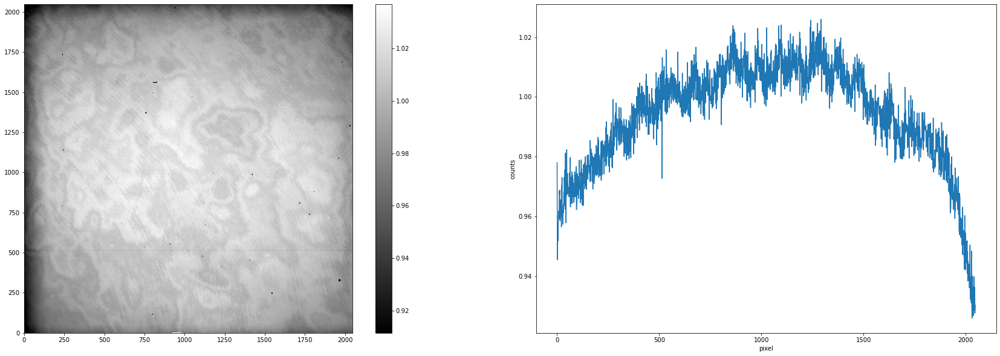

In [52]:
make_masterflat("I", np.arange(57, 63))

I band is quite bad with these patterns. We shouldn't use them?

# Task 4 divide science image by flat
This will be performed later when aperture etc. Tasks are performed with flat_correct() function. 

# Task 5 compute gain and readnoise for CCD
For gain, first substract the bias, and then flat correct the flat field, last use the equation
$$G(e^{-}/ADU) = \frac{\bar F}{\sigma^2_{F}}$$

For readout noise,
$$R = G \frac{\sigma_{B1-B2}}{\sqrt 2}$$

The gain and readout noise calculation should be limited in the central region, since the efficiency at edges of the image will drop significantly, as we can see in both the line plot and 2D image. This leads to a small gain. 

In [94]:
# choose a V band flat
sample_flat = ccdp.CCDData.read("../reduction/flat/V_band/a043_d.fits")
masterV = ccdp.CCDData.read("../reduction/flat/V_band/masterflatV_norm.fits")

sample_flat = ccdp.trim_image(sample_flat[300:1800, 300:1800])
masterV = ccdp.trim_image(masterV[300:1800, 300:1800])

In [95]:
flat_corr = ccdp.flat_correct(sample_flat, masterV)

In [97]:
# get two sample bias
sample_b1 = ccdp.CCDData.read("../reduction/bias/a096_zt.fits")
sample_b2 = ccdp.CCDData.read("../reduction/bias/a108_zt.fits")
sample_b1 = ccdp.trim_image(sample_b1[300:1800, 300:1800])
sample_b2 = ccdp.trim_image(sample_b2[300:1800, 300:1800])

In [98]:
G = np.mean(flat_corr) / np.var(flat_corr)
R = G * np.std(sample_b1.data - sample_b2.data) / np.sqrt(2)

In [99]:
print(f"Gain is {G:.5f} e/ADU, readout noise is {R:.5f} e/ADU")

Gain is 0.16404 e/ADU, readout noise is 1.40452 e/ADU


# Task 6 measure FWHM of standard star

## cross the night

use same star across the night (PG1633), pick V filter

134-35	PG1633		 10	V	6:55 X=1.24 Focus=-100  <br>
206-07	PG1633		 10	V	     X=1.52  <br>
227-28	PG1633		  8	V	     X=2.10 (data missing)  <br>
229-30	PG1633		  5	V	     X=2.10 (data missing)  <br>
241-42  PG1633		 10	V	     X=2.21 <br>

B filters are 1 number before, R filters are 1 number after V.

In [112]:
masterbias = ccdp.CCDData.read("../reduction/bias/masterbias.fits")
masterflatV = ccdp.CCDData.read("../reduction/flat/V_band/masterflatV_norm.fits")
masterflatB = ccdp.CCDData.read("../reduction/flat/B_band/masterflatB_norm.fits")
masterflatR = ccdp.CCDData.read("../reduction/flat/R_band/masterflatR_norm.fits")

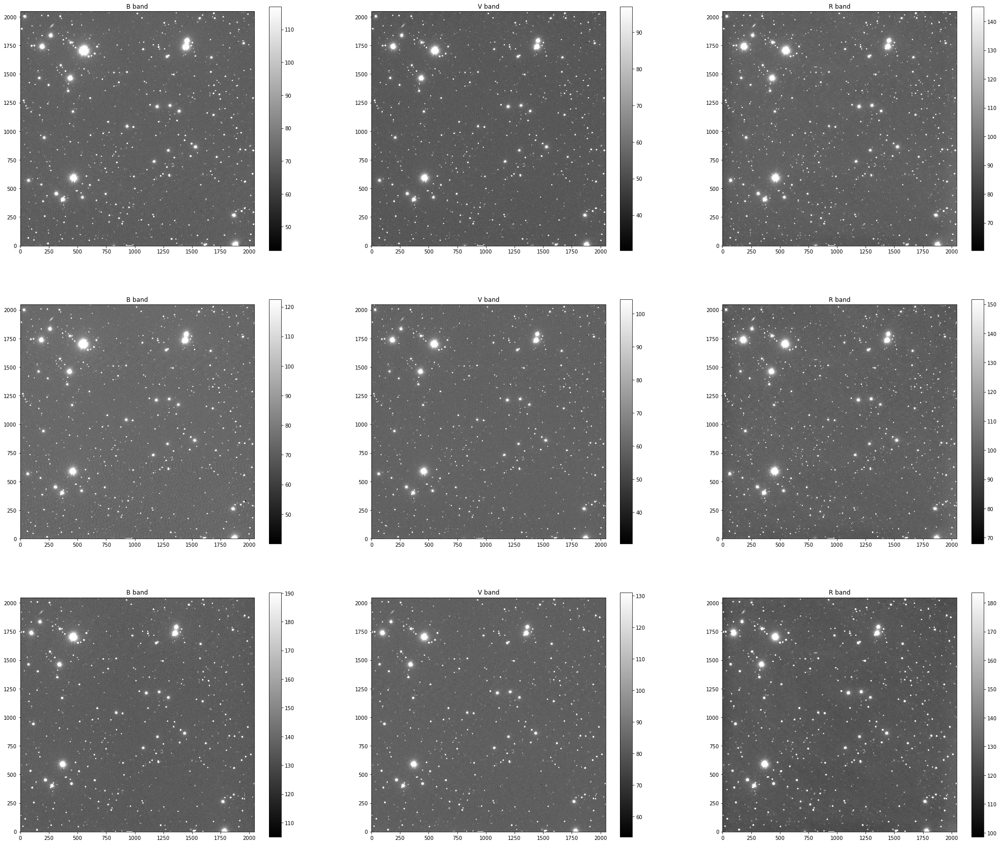

In [253]:
# first remove bias from all these images, and then flat field correct them

targets = [134, 206, 241]
fig, axs = plt.subplots(3, 3, figsize=(35, 30))
ax = axs.ravel()
for i, tar in enumerate(targets):
    # there are two science images per exposure, we can combine them easily
    # B band
    ccds = []
    for j in range(2):     
        a_num = tar+j-2
        file = file_template.format(num=a_num)
        ccd = ccdp.CCDData.read(file)
        ccd = ccdp.subtract_bias(ccd, masterbias)
        ccd = ccdp.flat_correct(ccd, masterflatB)
        ccd.write(f"../reduction/PG1633/a{a_num:0>3}_f.fits", overwrite=True)
        ccds.append(ccd)
    ccd_com = ccdp.combine(ccds, method='average')
    ccd_com.write(f"../reduction/PG1633/a{a_num-1:0>3}_{a_num:0>3}.fits")
    plot_zscale_image(ccd_com.data, ax[i*3], 'gray')
    ax[i*3].set_title("B band")
    
    
    # V band
    ccds = []
    for j in range(2):  
        a_num = tar+j
        file = file_template.format(num=a_num)
        ccd = ccdp.CCDData.read(file)
        ccd = ccdp.subtract_bias(ccd, masterbias)
        ccd = ccdp.flat_correct(ccd, masterflatV)
        ccd.write(f"../reduction/PG1633/a{a_num:0>3}_f.fits", overwrite=True)
        ccds.append(ccd)
    ccd_com = ccdp.combine(ccds, method='average')
    ccd_com.write(f"../reduction/PG1633/a{a_num-1:0>3}_{a_num:0>3}.fits")
    plot_zscale_image(ccd_com.data, ax[i*3+1], 'gray')
    ax[i*3+1].set_title("V band")
    
    
    # R band
    ccds = []
    for j in range(2):     
        a_num = tar+j+2
        file = file_template.format(num=a_num)
        ccd = ccdp.CCDData.read(file)
        ccd = ccdp.subtract_bias(ccd, masterbias)
        ccd = ccdp.flat_correct(ccd, masterflatB)
        ccd.write(f"../reduction/PG1633/a{a_num:0>3}_f.fits", overwrite=True)
        ccds.append(ccd)
    ccd_com = ccdp.combine(ccds, method='average')
    ccd_com.write(f"../reduction/PG1633/a{a_num-1:0>3}_{a_num:0>3}.fits")
    plot_zscale_image(ccd_com.data, ax[i*3+2], 'gray')
    ax[i*3+2].set_title("R band")

From the a134_f.fits, used DS9 to pick some star across the image in format (x, y, radius) <br>
circle(557.1865,1702.8184,59.719676) -> saturated <br>
circle(434.76115,1463.9396,37.872597) <br>
circle(264.56006,1840.1736,30.961936) <br>
circle(993.14016,1033.958,24.494198) <br>
circle(1303.6825,1228.0469,32.391515) <br>
circle(1527.6313,863.75686,27.610016) <br>
circle(1918.7952,842.85498,13.136307) <br>
circle(2026.2906,630.85011,16.67732) <br>
557.1865 1702.8184
264.56006 1840.1736
993.14016 1033.958
1303.6825 1228.0469
1527.6313 863.75686
1918.7952 842.85498
2026.2906 630.85011


In [207]:
circles = [
            (434.76115,1463.9396,37.872597),
            (264.56006,1840.1736,30.961936),
            (993.14016,1033.958,24.494198),
            (1303.6825,1228.0469,32.391515),
            (1527.6313,863.75686,27.610016),
            (1918.7952,842.85498,13.136307),
            (2026.2906,630.85011,16.67732)
        ]

In [ ]:
from astropy.modeling import models, fitting

FWHM: x 5.7396077420337335, y 6.158628454602318


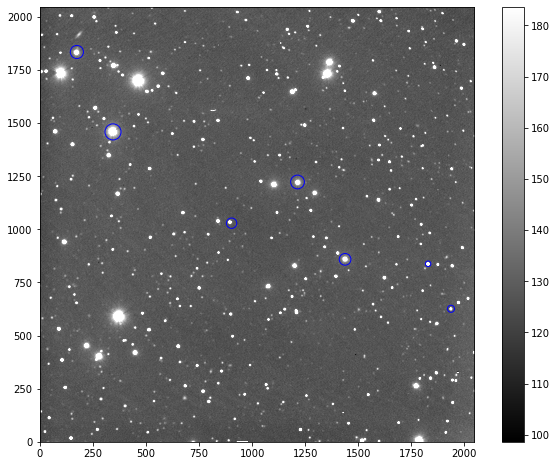

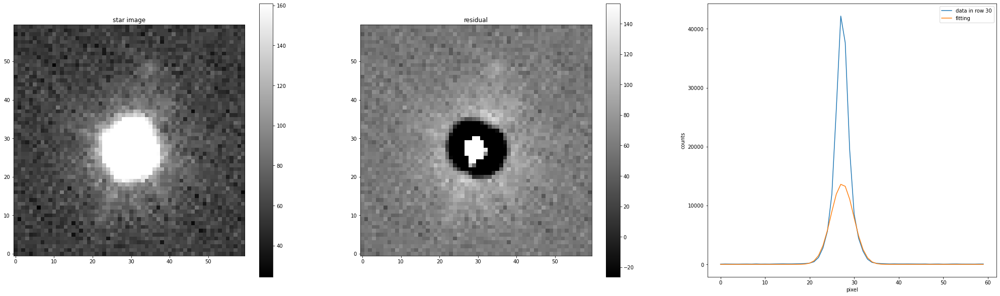

In [297]:
ccddata = ccdp.CCDData.read(f"../reduction/PG1633/a134_135.fits")
fig, ax = plt.subplots(1, 1, figsize=(10, 8))
plot_zscale_image(ccd_com.data, ax, 'gray')
ax.set_aspect("equal")
for cir in circles:
    # wired enough that I need to shift every circle horizontally by 90 pixels???
    circle = plt.Circle( (cir[0]-90, cir[1]-5), cir[2], fill = False, color='blue')
    ax.add_artist(circle)

cir = circles[1]
xc = int(cir[0])
yc = int(cir[1])
# Cut out smaller box around PSF
bb = int(cir[2])
box = ccddata[yc-bb:yc+bb,xc-bb:xc+bb]
yp, xp = box.shape

# Generate grid of same size like box to put the fit on
y, x, = np.mgrid[:yp, :xp]


f_init = models.Gaussian2D()
# Declare what fitting function you want to use
fit_f = fitting.LevMarLSQFitter()
# Fit the model to your data (box)
f = fit_f(f_init, x, y, box.data)
fig, ax = plt.subplots(1, 3, figsize=(35, 10))
plot_zscale_image(box, ax[0], 'gray')
ax[0].set_title("star image")
plot_zscale_image(box.data - f(x, y), ax[1], 'gray')
ax[1].set_title("residual")
ax[2].plot(box.data[:, 30].ravel(), label='data in row 30')
ax[2].plot(f(x, y)[:, 30].ravel(), label='fitting')
ax[2].set_ylabel("counts")
ax[2].set_xlabel("pixel")
ax[2].legend()
print(f"FWHM: x {f.x_fwhm}, y {f.y_fwhm}")

Saturation in the center of the star

FWHM: x 5.779561002838174, y 5.632043819561982


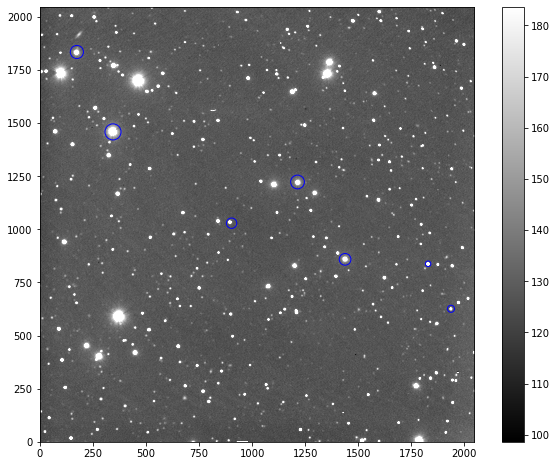

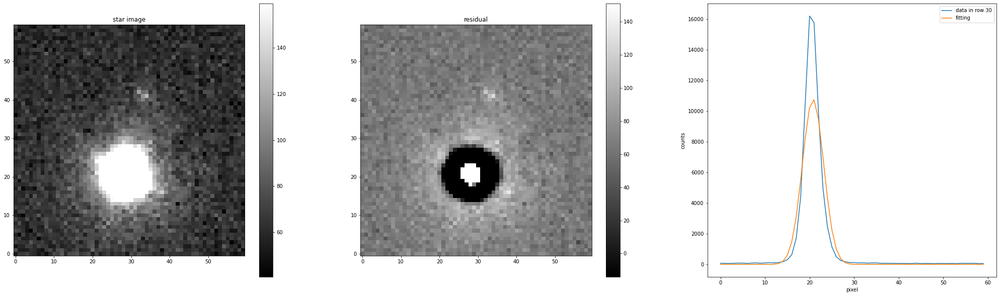

In [295]:
ccddata = ccdp.CCDData.read(f"../reduction/PG1633/a206_207.fits")
fig, ax = plt.subplots(1, 1, figsize=(10, 8))
plot_zscale_image(ccd_com.data, ax, 'gray')
ax.set_aspect("equal")
for cir in circles:
    # wired enough that I need to shift every circle horizontally by 90 pixels???
    circle = plt.Circle( (cir[0]-90, cir[1]-5), cir[2], fill = False, color='blue')
    ax.add_artist(circle)

cir = circles[1]
xc = int(cir[0])-5
yc = int(cir[1])
# Cut out smaller box around PSF
bb = int(cir[2])
box = ccddata[yc-bb:yc+bb,xc-bb:xc+bb]
yp, xp = box.shape

# Generate grid of same size like box to put the fit on
y, x, = np.mgrid[:yp, :xp]


f_init = models.Gaussian2D()
# Declare what fitting function you want to use
fit_f = fitting.LevMarLSQFitter()
# Fit the model to your data (box)
f = fit_f(f_init, x, y, box.data)
fig, ax = plt.subplots(1, 3, figsize=(35, 10))
plot_zscale_image(box, ax[0], 'gray')
ax[0].set_title("star image")
plot_zscale_image(box.data - f(x, y), ax[1], 'gray')
ax[1].set_title("residual")
ax[2].plot(box.data[:, 30].ravel(), label='data in row 30')
ax[2].plot(f(x, y)[:, 30].ravel(), label='fitting')
ax[2].set_ylabel("counts")
ax[2].set_xlabel("pixel")
ax[2].legend()
print(f"FWHM: x {f.x_fwhm}, y {f.y_fwhm}")

FWHM: x 5.987566641222093, y 5.43434528240505


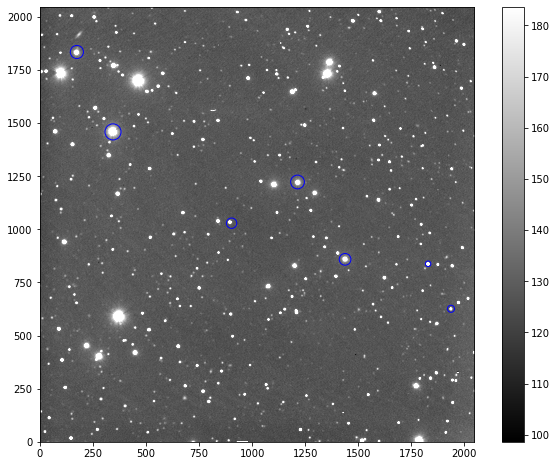

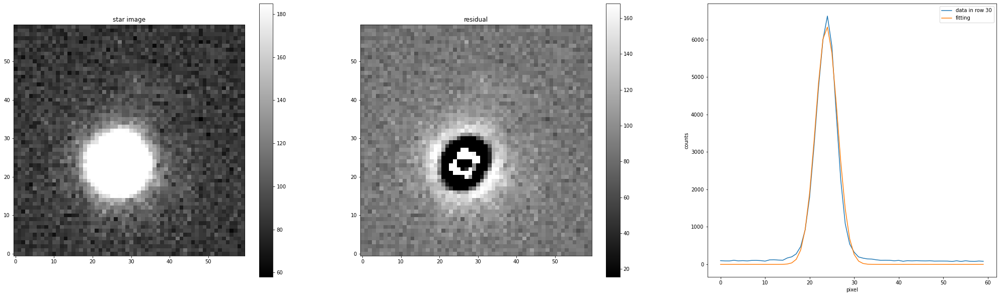

In [290]:
ccddata = ccdp.CCDData.read(f"../reduction/PG1633/a241_242.fits")
fig, ax = plt.subplots(1, 1, figsize=(10, 8))
plot_zscale_image(ccd_com.data, ax, 'gray')
ax.set_aspect("equal")
for cir in circles:
    # wired enough that I need to shift every circle horizontally by 90 pixels???
    circle = plt.Circle( (cir[0]-90, cir[1]-5), cir[2], fill = False, color='blue')
    ax.add_artist(circle)

cir = circles[1]
xc = int(cir[0]) - 90
yc = int(cir[1])
# Cut out smaller box around PSF
bb = int(cir[2])
box = ccddata[yc-bb:yc+bb,xc-bb:xc+bb]
yp, xp = box.shape

# Generate grid of same size like box to put the fit on
y, x, = np.mgrid[:yp, :xp]


f_init = models.Gaussian2D()
# Declare what fitting function you want to use
fit_f = fitting.LevMarLSQFitter()
# Fit the model to your data (box)
f = fit_f(f_init, x, y, box.data)
fig, ax = plt.subplots(1, 3, figsize=(35, 10))
plot_zscale_image(box, ax[0], 'gray')
ax[0].set_title("star image")
plot_zscale_image(box.data - f(x, y), ax[1], 'gray')
ax[1].set_title("residual")
ax[2].plot(box.data[:, 30].ravel(), label='data in row 30')
ax[2].plot(f(x, y)[:, 30].ravel(), label='fitting')
ax[2].set_ylabel("counts")
ax[2].set_xlabel("pixel")
ax[2].legend()
print(f"FWHM: x {f.x_fwhm}, y {f.y_fwhm}")

Throughout the night, as the airmass increases, the light is smeared out more, and thus the FWHM of PSF increases, but not very significantly.

## FWHM changes across chip

FWHM: x 5.7396077420337335, y 6.158628454602318
FWHM: x 5.197831749717167, y 4.392348522525582
FWHM: x 3.742531064942341, y 3.916765302656128
FWHM: x 3.5494150302059, y 3.882482964310285
FWHM: x 3.583379022769114, y 4.194658511784442
FWHM: x 4.750553765661154, y 3.7524965777069794
FWHM: x 5.009977929268967, y 4.094802551059457


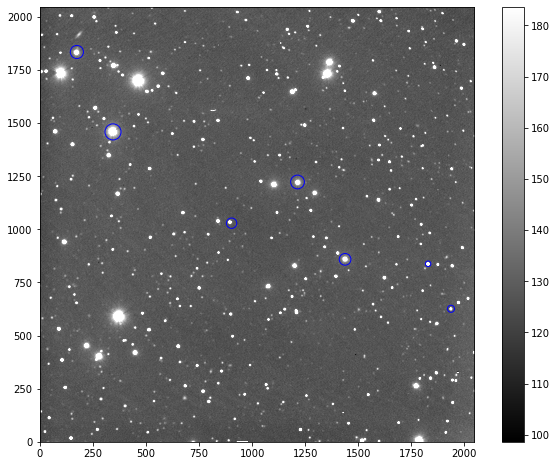

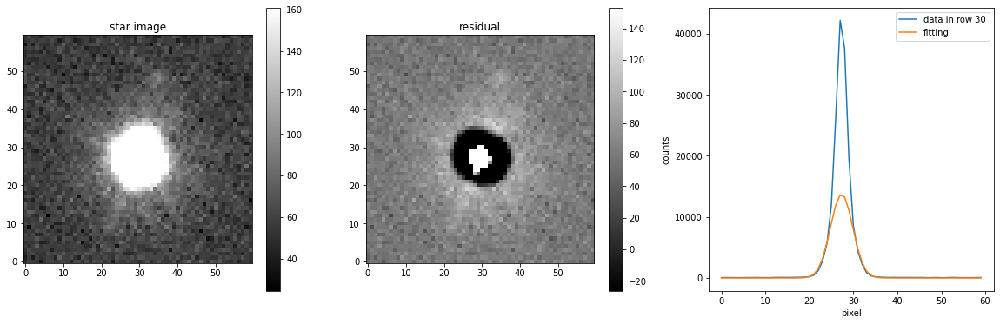

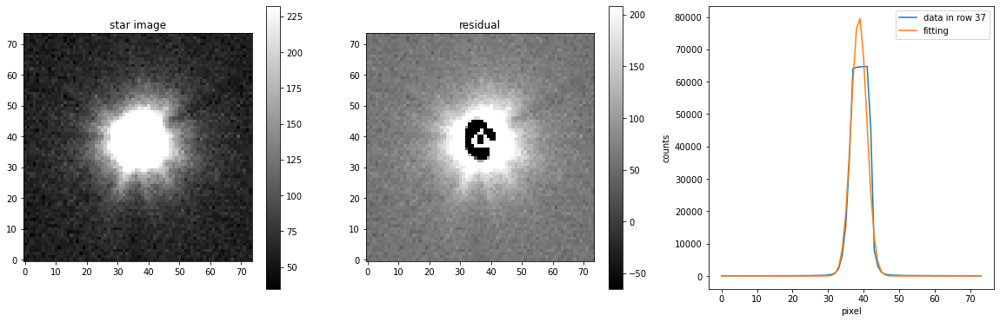

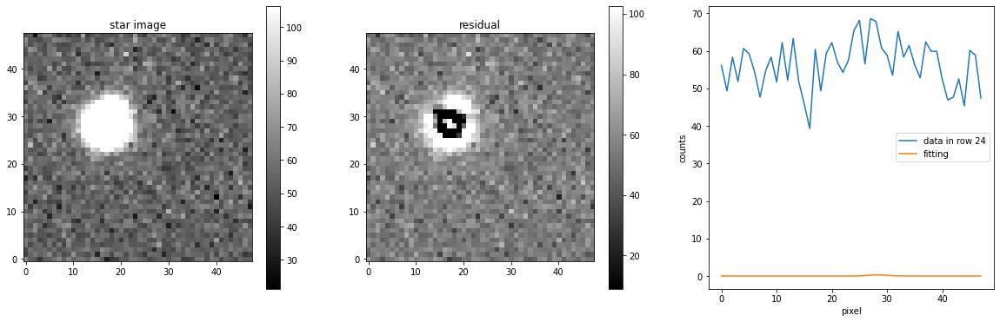

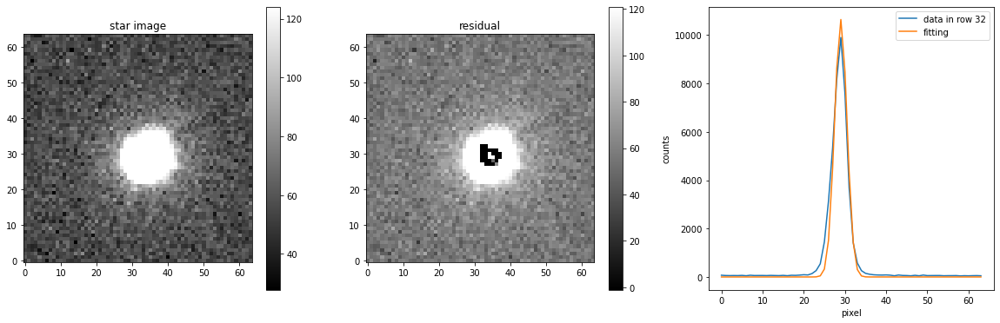

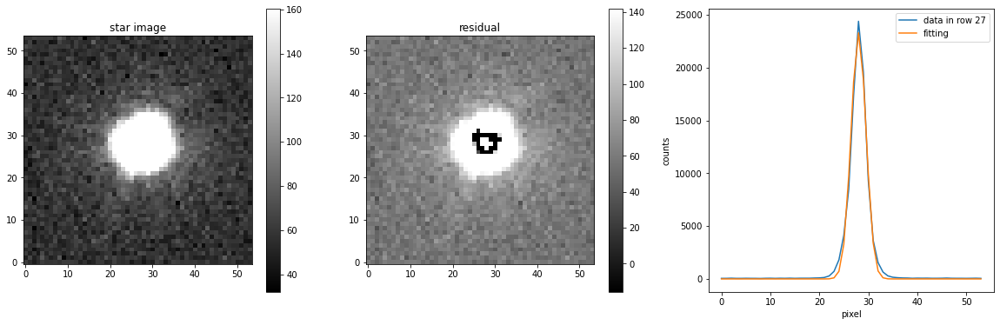

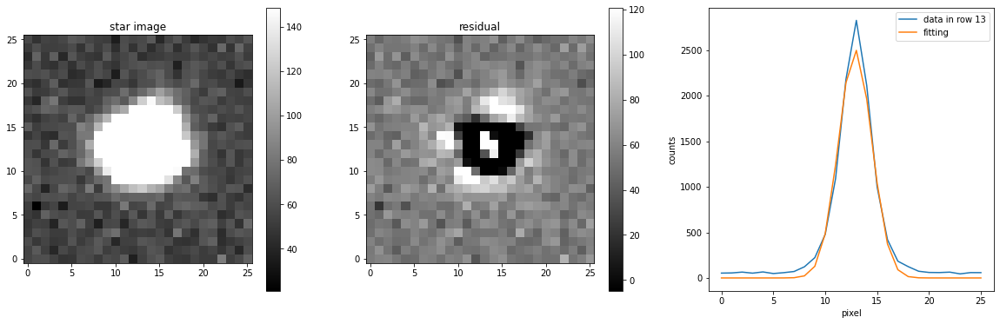

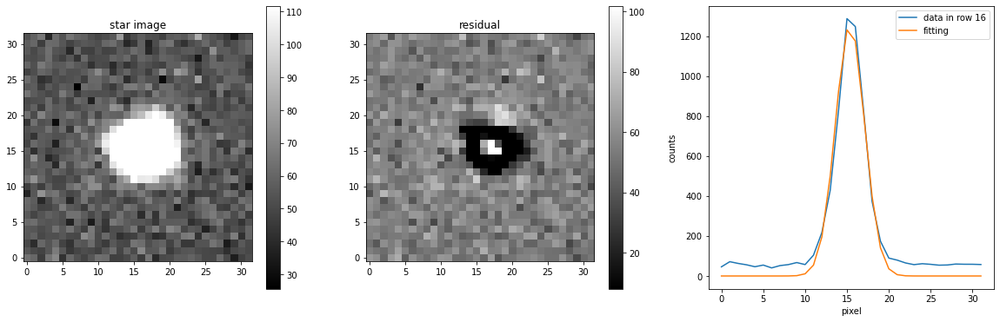

In [338]:
ccddata = ccdp.CCDData.read(f"../reduction/PG1633/a134_135.fits")
fig, ax = plt.subplots(1, 1, figsize=(10, 8))
plot_zscale_image(ccd_com.data, ax, 'gray')
ax.set_aspect("equal")
# sort according to x location
circles = sorted(circles, key=lambda x: x[0])
for cir in circles:
    # wired enough that I need to shift every circle horizontally by 90 pixels???
    circle = plt.Circle( (cir[0]-90, cir[1]-5), cir[2], fill = False, color='blue')
    ax.add_artist(circle)
    
for cir in circles:
#     cir = circles[1]
    xc = int(cir[0])
    yc = int(cir[1])
    # Cut out smaller box around PSF
    bb = int(cir[2])
    box = ccddata[yc-bb:yc+bb,xc-bb:xc+bb]
    yp, xp = box.shape

    # Generate grid of same size like box to put the fit on
    y, x, = np.mgrid[:yp, :xp]


    f_init = models.Gaussian2D()
    # Declare what fitting function you want to use
    fit_f = fitting.LevMarLSQFitter()
    # Fit the model to your data (box)
    f = fit_f(f_init, x, y, box.data)
    fig, ax = plt.subplots(1, 3, figsize=(20, 6))
    plot_zscale_image(box, ax[0], 'gray')
    ax[0].set_title("star image")
    plot_zscale_image(box.data - f(x, y), ax[1], 'gray')
    ax[1].set_title("residual")
    cen = int(len(box.data) / 2)
    ax[2].plot(box.data[:, cen].ravel(), label=f'data in row {cen}')
    ax[2].plot(f(x, y)[:, cen].ravel(), label='fitting')
    ax[2].set_ylabel("counts")
    ax[2].set_xlabel("pixel")
    ax[2].legend()
    print(f"FWHM: x {f.x_fwhm}, y {f.y_fwhm}")

Except for the last star, which has a quite bad fitting because of the high residual, the FWHM has a variation across the chip, the maximum variation is about 1.5 pixels. 

In [330]:
from photutils.centroids import centroid_sources, centroid_com, centroid_quadratic

In [331]:
list(zip(*circles))

[(264.56006, 434.76115, 993.14016, 1303.6825, 1527.6313, 1918.7952, 2026.2906),
 (1840.1736, 1463.9396, 1033.958, 1228.0469, 863.75686, 842.85498, 630.85011),
 (30.961936, 37.872597, 24.494198, 32.391515, 27.610016, 13.136307, 16.67732)]

pick new three <br>
1087.8148 1104.2824 <br>
1367.1667 1094.1667 <br>
1209.1497 1085.2816 <br>

In [461]:
new_circles = [(1087.8148, 1104.2824), (1367.1667, 1094.1667), (1209.1497,1085.2816)]

In [558]:
x_init, y_init, bbox = list(zip(*circles))
x, y = centroid_sources(ccddata.data, x_init, y_init, box_size=21,
                        centroid_func=centroid_com)

In [561]:
new_cen = list(zip(x, y, bbox))
new_cen_xy = list(zip(x, y))

FWHM: x 8.014230577142047, y 8.965226923505822
FWHM: x 5.197563058958944, y 4.392218133928261


FWHM: x 3.9167670629734395, y 3.742534824307675
FWHM: x 7.8755855862254975, y 7.5503088788692
FWHM: x 4.194660853132156, y 3.583382128747343
FWHM: x 4.750553765661154, y 3.7524965777069794
FWHM: x 5.009977929268967, y 4.094802551059457


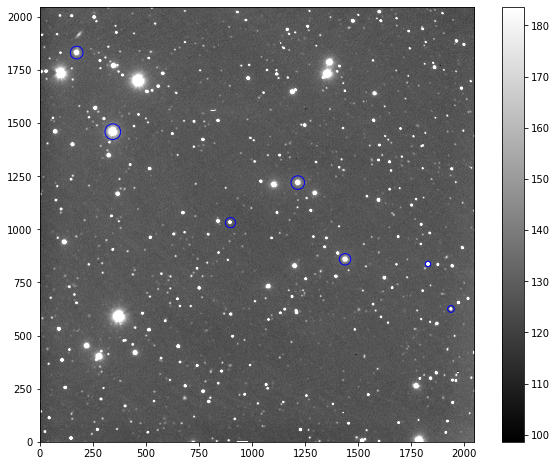

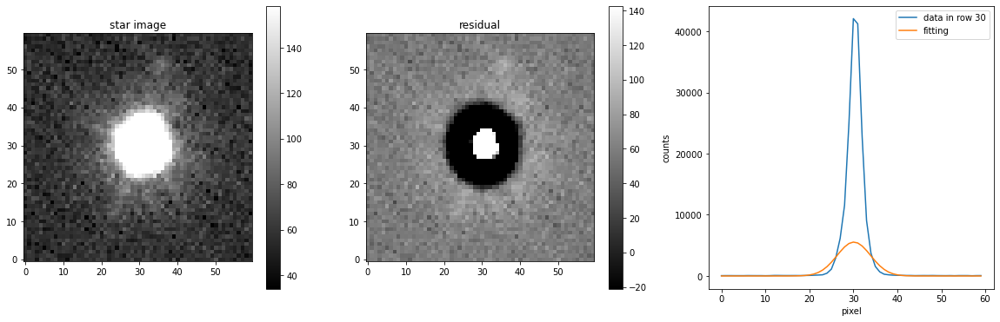

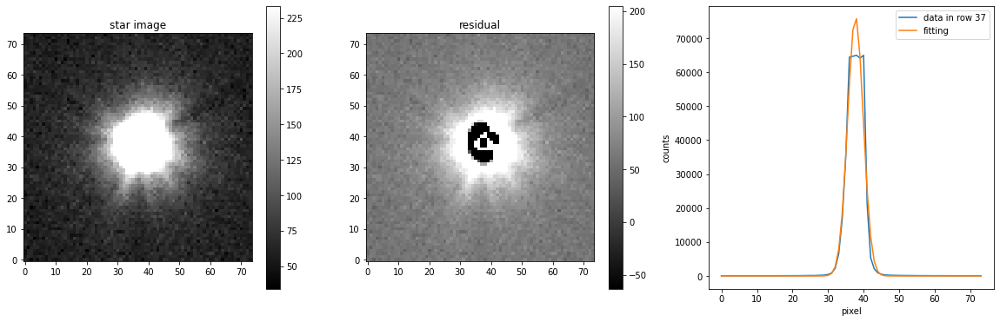

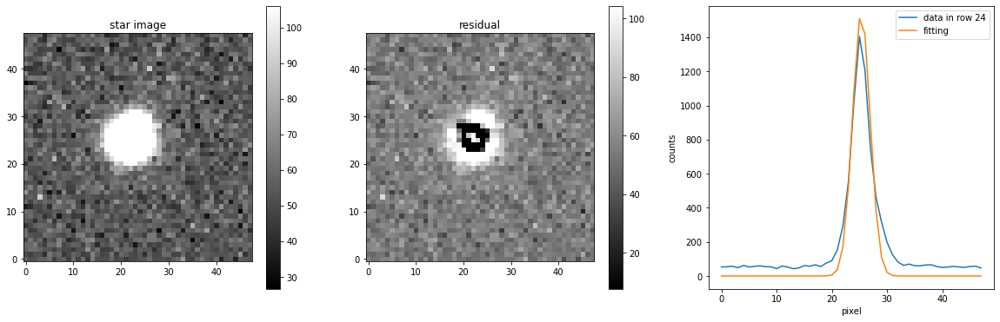

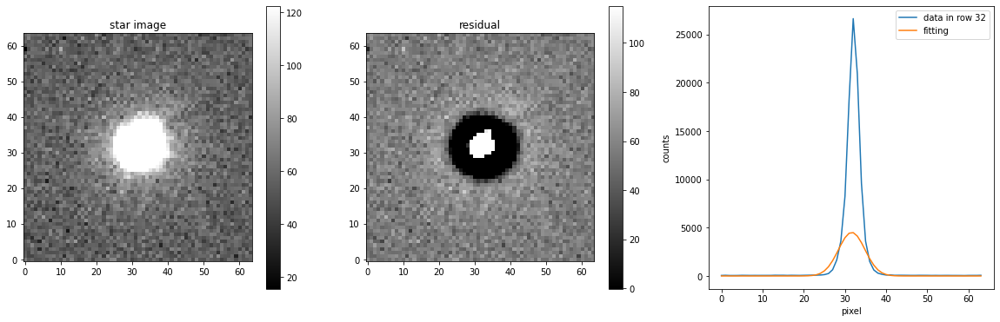

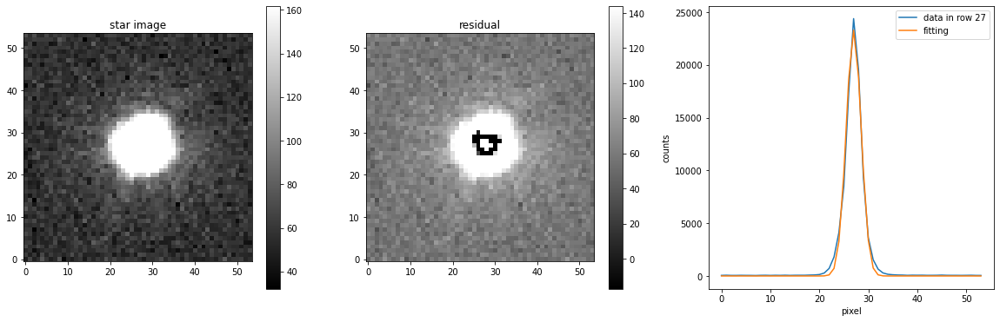

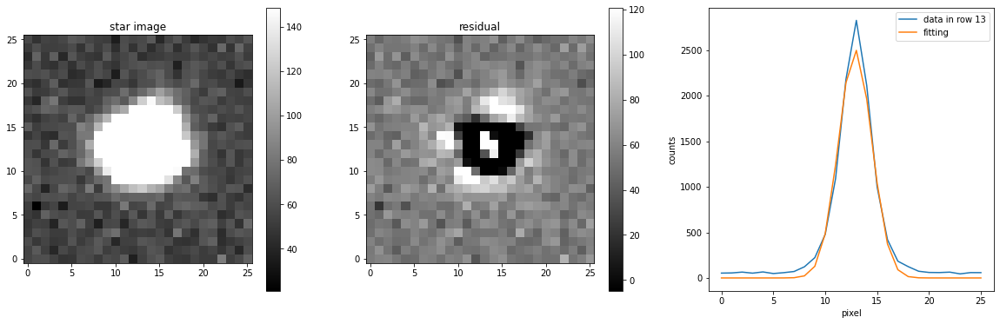

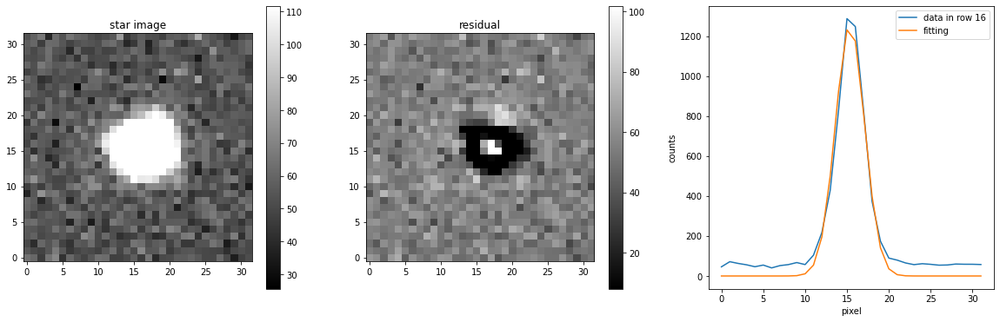

In [494]:
ccddata = ccdp.CCDData.read(f"../reduction/PG1633/a134_135.fits")
fig, ax = plt.subplots(1, 1, figsize=(10, 8))
plot_zscale_image(ccd_com.data, ax, 'gray')
ax.set_aspect("equal")
# sort according to x location
new_cen = sorted(new_cen, key=lambda x: x[0])
for cir in new_cen:
    # wired enough that I need to shift every circle horizontally by 90 pixels???
    circle = plt.Circle( (cir[0]-90, cir[1]-5), int(cir[2]), fill = False, color='blue')
    ax.add_artist(circle)
    
for cir in new_cen:
#     cir = circles[1]
    xc = int(cir[0])
    yc = int(cir[1])
    # Cut out smaller box around PSF
    bb = int(cir[2])
    box = ccddata[yc-bb:yc+bb,xc-bb:xc+bb]
    yp, xp = box.shape

    # Generate grid of same size like box to put the fit on
    y, x, = np.mgrid[:yp, :xp]


    f_init = models.Gaussian2D()
    # Declare what fitting function you want to use
    fit_f = fitting.LevMarLSQFitter()
    # Fit the model to your data (box)
    f = fit_f(f_init, x, y, box.data)
    fig, ax = plt.subplots(1, 3, figsize=(20, 6))
    plot_zscale_image(box, ax[0], 'gray')
    ax[0].set_title("star image")
    plot_zscale_image(box.data - f(x, y), ax[1], 'gray')
    ax[1].set_title("residual")
    cen = int(len(box.data) / 2)
    ax[2].plot(box.data[:, cen].ravel(), label=f'data in row {cen}')
    ax[2].plot(f(x, y)[:, cen].ravel(), label='fitting')
    ax[2].set_ylabel("counts")
    ax[2].set_xlabel("pixel")
    ax[2].legend()
    print(f"FWHM: x {f.x_fwhm}, y {f.y_fwhm}")

Photutils didn't specify the error for x and y centroid with all the centroid functions. The method I used to find the center is the image moment, which is weighted by the count of each pixel. Therefore, the error must follow Possion distribution. proportional to 
$$S/N \propto R_{faint} \sim \sqrt{t}$$

# Task 8, aperture photometry on three stars
From the 7 stars, pick 1 from left two, 1 from middle three, and 1 from right two

In [528]:
targets = [new_cen[0][:2], new_cen[3][:2], new_cen[-1][:2]]

In [529]:
from astropy.stats import sigma_clipped_stats
from photutils.aperture import CircularAperture, ApertureStats, CircularAnnulus

In [551]:
annulus_aperture = CircularAnnulus(targets, r_in=10, r_out=15)
aperstats = ApertureStats(ccddata.data, annulus_aperture)
bkg_mean = aperstats.mean
print(bkg_mean)  

[82.70749165 71.73706091 54.66446876]


In [552]:
rads = np.arange(1, 8)
sn_arr = np.zeros((3, len(rads)))
for i in range(3):
    for j, radius in enumerate(rads):
        aperture = CircularAperture(targets[i][:2], r=radius)
        aperture_area = aperture.area_overlap(ccddata.data)
        aperstats = ApertureStats(ccddata.data - bkg_mean[i]*aperture_area, aperture) 
        sn_arr[i, j] = aperstats.sum/aperstats.std
#     print(aperstats.xcentroid)  
#     print(aperstats.ycentroid)  
#     print(aperstats.centroid)  
#     print(aperstats.mean, aperstats.median, aperstats.std)  
#     print(f"S/N: {aperstats.mean/aperstats.std}")

(0.0, 60.0)

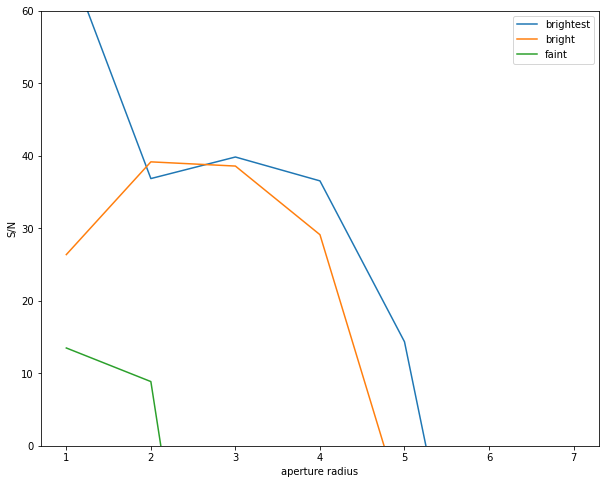

In [553]:
plt.figure(figsize=(10, 8))
plt.plot(rads, sn_arr[0, :], label="brightest")
plt.plot(rads, sn_arr[1, :], label='bright')
plt.plot(rads, sn_arr[2, :], label='faint')
plt.legend()
plt.xlabel("aperture radius")
plt.ylabel("S/N")
plt.ylim([0, 60])

From the above plot, we can see that the faint star is too small, so drop too fast. The brighter and brightest stars have maximum S/N at around 2, 3 respectively.

# Task 9 Convert to instrumental magnitude
$$M_{inst} = -2.5 * \log (FLUX/TIME) + Z.P.$$

In [585]:
annulus_aperture = CircularAnnulus(new_cen_xy, r_in=10, r_out=15)
aperstats = ApertureStats(ccddata.data, annulus_aperture)
bkg_mean = aperstats.mean
print(bkg_mean)  

rads = np.arange(1, 6)
sn_arr = np.zeros((len(new_cen_xy), len(rads)))
counts = np.zeros_like(sn_arr)
for i in range(len(new_cen_xy)):
    for j, radius in enumerate(rads):
        aperture = CircularAperture(new_cen_xy[i][:2], r=radius)
        aperture_area = aperture.area_overlap(ccddata.data)
        aperstats = ApertureStats(ccddata.data - bkg_mean[i]*aperture_area, aperture)
        counts[i, j] = aperstats.sum 
        sn_arr[i, j] = aperstats.sum/aperstats.std
#     print(aperstats.xcentroid)  
#     print(aperstats.ycentroid)  
#     print(aperstats.centroid)  
#     print(aperstats.mean, aperstats.median, aperstats.std)  
#     print(f"S/N: {aperstats.mean/aperstats.std}")

[ 82.70749165 160.1445193   56.20447412  71.73706091  73.29141537
  55.31596084  54.66446876]


In [615]:
# besides the rad=1 pix, which is the largest S/N radius
print(counts[np.arange(0, 7), np.argmax(sn_arr[:, 1:], axis=1) + 1])    
print(counts[np.arange(0, 7), np.argmax(sn_arr[:, 1:], axis=1) - 1])    
print(counts[np.arange(0, 7), np.argmax(sn_arr[:, 1:], axis=1) + 2])    

[441320.96175869 762521.04979339   6709.63987124 184883.88583606
 266870.07746328  13884.15697517   2791.73863672]
[ 125068.44027998  972948.91973046 -287449.54902119  -52399.59284742
   72361.9188143  -290133.46682546 -307931.58258079]
[ 393399.68627912 1294024.80366536  -12725.18457929  238005.2047091
  212478.66155547   -8575.9701542   -24393.21097508]


In [618]:
zp = 0
M_inst = -2.5 * np.log10(counts[np.arange(0, 7), np.argmax(sn_arr[:, 1:], axis=1) + 1] / ccddata.header['EXPTIME']) + zp

In [619]:
M_inst

array([-11.61188639, -12.20562959,  -7.06674803, -10.66724765,
       -11.0657497 ,  -7.85629879,  -6.11468689])

# Task 10
74			2	V	X=1.19	  linearity test <br>
75			4	V	<br>
76			8	V	<br>
77			16	V	<br>
78			32	V	<br>
79			64	V<br>
80		       128	V<br>	

In [636]:
for i in range(74, 81):
    file = file_template.format(num=i)
    ccd = ccdp.CCDData.read(file)
    ccd = ccdp.subtract_bias(ccd, masterbias)
    ccd = ccdp.flat_correct(ccd, masterflatV)
    ccd.write(f"../reduction/linearity/a{i:0>3}_f.fits", overwrite=True)

In [649]:
# track one of the faintest star to prevent saturation
star1 = []
star2 = []
for i in range(74, 81):
    ccd = ccdp.CCDData.read(f"../reduction/linearity/a{i:0>3}_f.fits")
    apertures = CircularAperture([new_cen_xy[0][:2], new_cen_xy[-2][:2]], r=4.0)
    aperstats = ApertureStats(ccd.data, apertures)
    star1.append(aperstats.sum[0])
    star2.append(aperstats.sum[1])

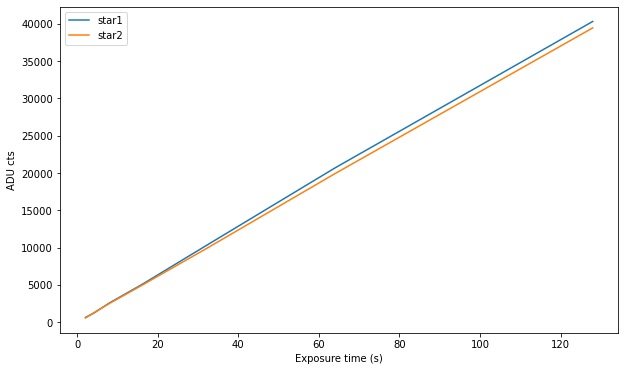

In [650]:
plt.figure(figsize=(10, 6))
plt.plot(2**np.arange(1, 81-74+1), star1, label='star1')
plt.plot(2**np.arange(1, 81-74+1), star2, label='star2')
plt.xlabel('Exposure time (s)')
plt.ylabel("ADU cts")
plt.legend()

CCDs are pretty linear 

# Task 11
From astrometry.net, the upper leftmost star is Tycho-2 964-1184-1, so use that as our standard star and then plot the magnitude

In [648]:
2**16

65536

# Task 12

Need wcs to find stars and correlate them to get the extinction curve.